### Required packages:

1. pandas
2. numpy
3. sklearn.decomposition - PCA
4. wpca - WPCA
5. sklearn.preprocessing - StandardScaler
6. re
7. os
8. datetime - date
9. statsmodels.api
10. statsmodels.formula.api - ols
11. matplotlib.pyplot
12. seaborn
13. urllib.error - HTTPError, URLError
14. time
15. sys
16. random - sample

In [1]:
import trong

/home/augjan/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


### Data setup

In [2]:
[dataset, dataset2] = trong.data_set() #Fetch mRNA expression data
expdata = trong.indexing(dataset,dataset2) #Properly index the mRNA expression data

kbp, MACS2, MAX = 10,300,100 # Parameters for ChIP-atlas filtration
TF_gene_sets = trong.gene_sets(kbp,MACS2,MAX) # Fetch gene lists from ChIP-atlas

### Data analysis

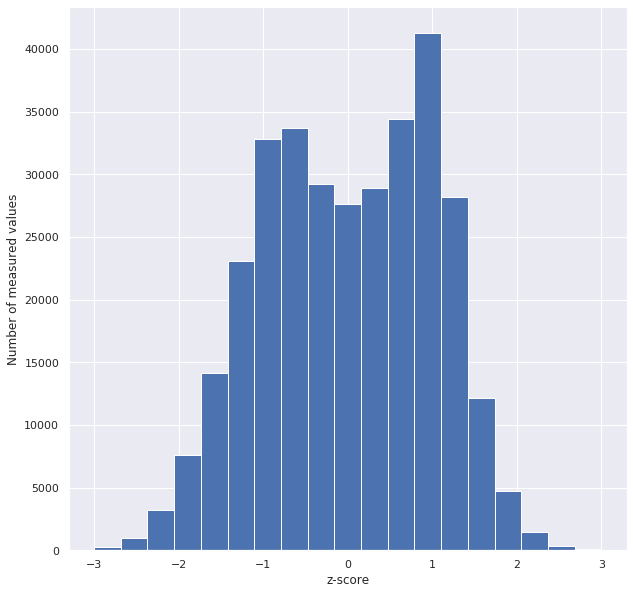

In [12]:
logdata = trong.dataprep(expdata)
plot = trong.datadist(logdata)

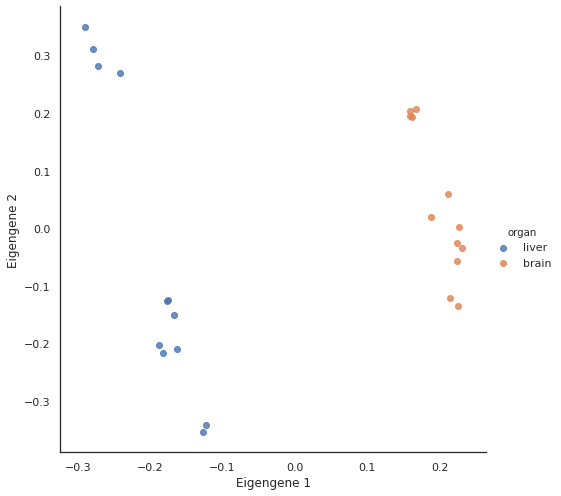

In [13]:
logdata = trong.dataprep(expdata)
u,s,v = trong.SVD(logdata)
trong.Sample_behaviour_plot(logdata,u,s,v, sep='organ')

# Remove all genes with 0-values
## All PCs

In [3]:
n_pc = 1
pc = 1
TFs = ['Tal1','Lmo2','Ncapg','Ikzf1','Top2a','Klf9','Brca1','Mllt3','Rb1','Sox11','Zfp57','Lmnb1','Sox4','Satb2','Tcf7l2','Nr1d2','Nr3c1']
remove = None
filtering = False

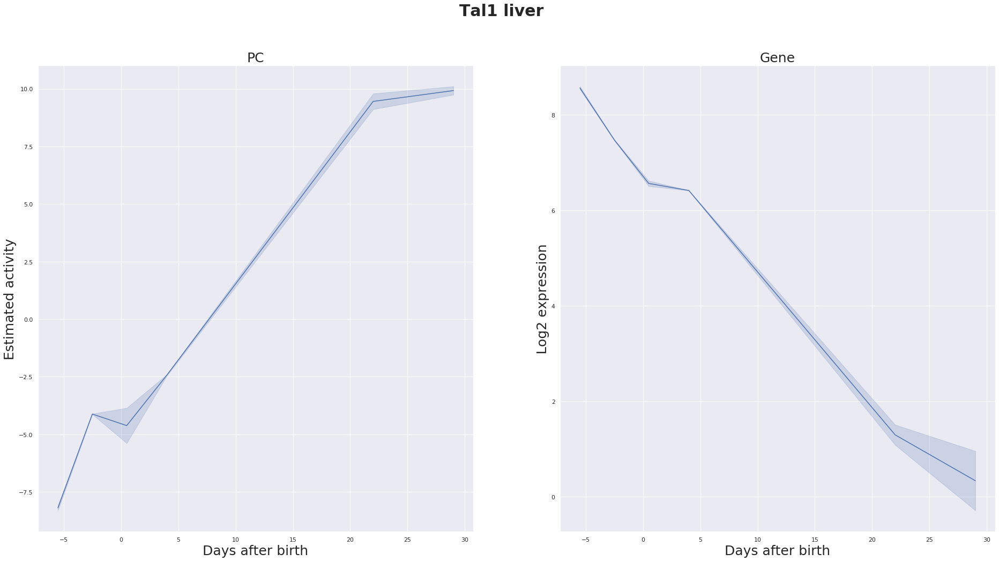

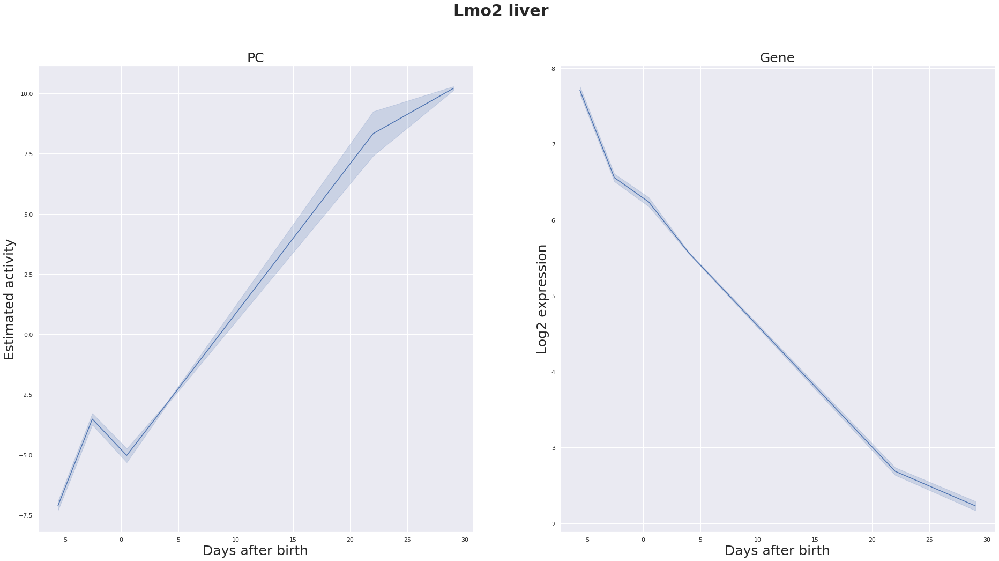

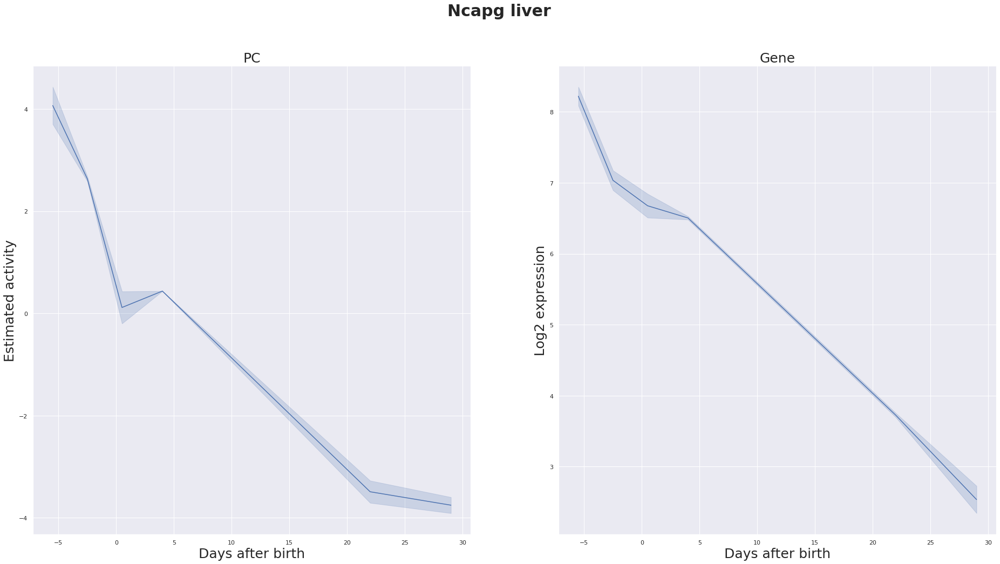

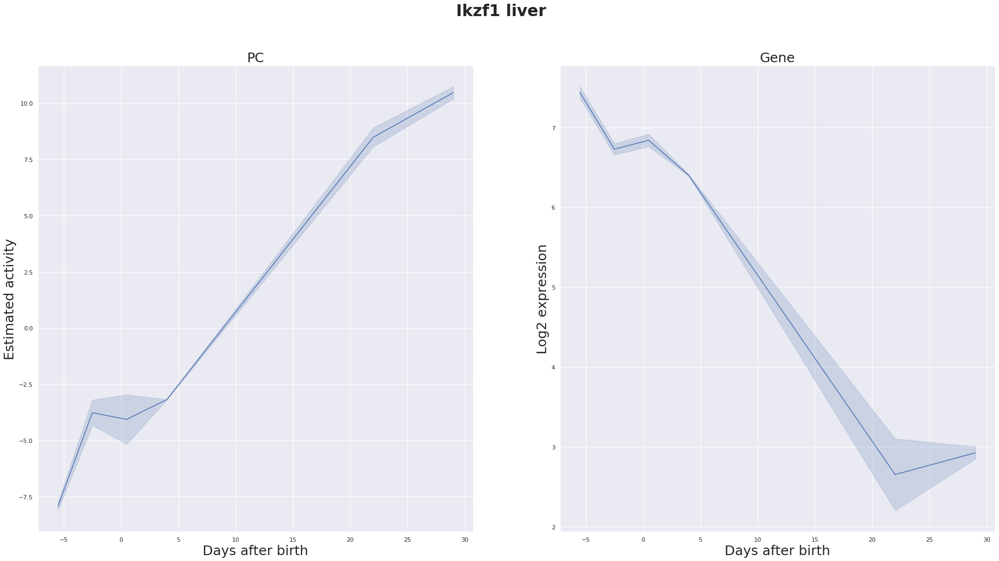

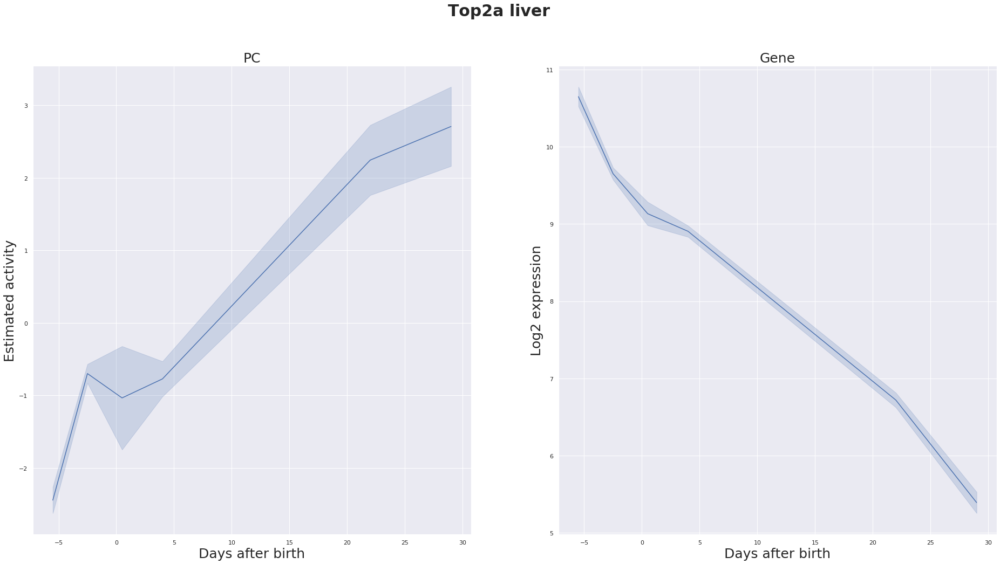

...

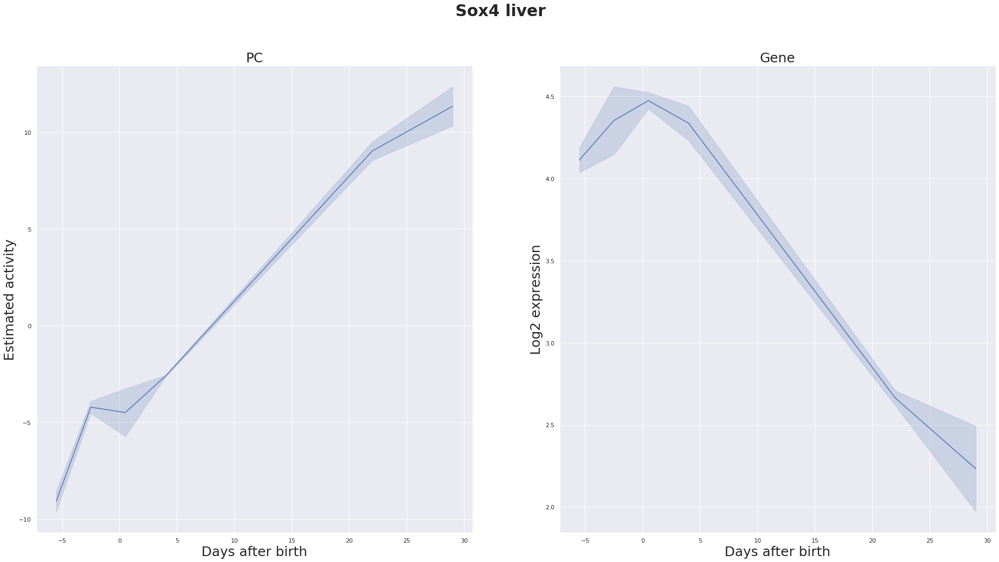

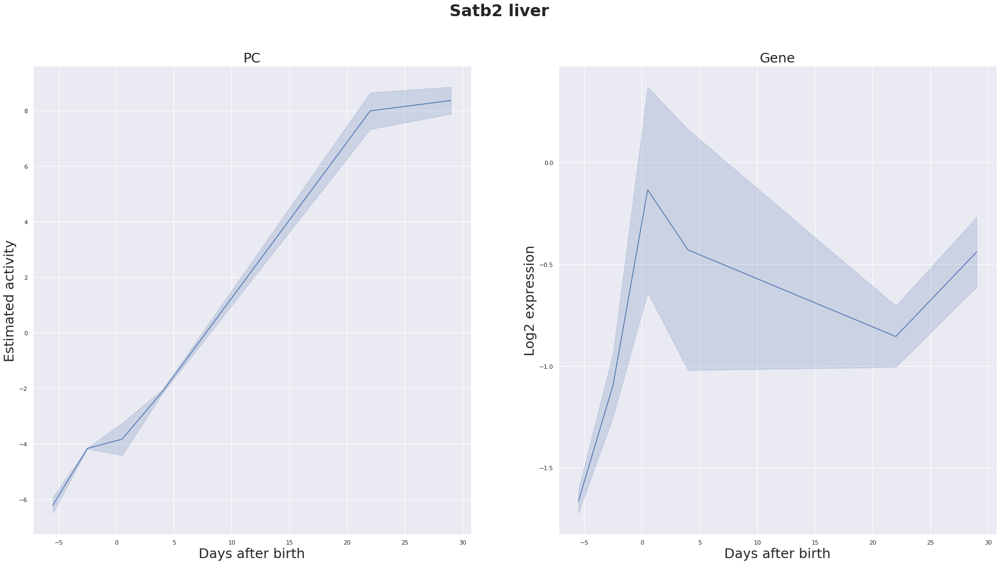

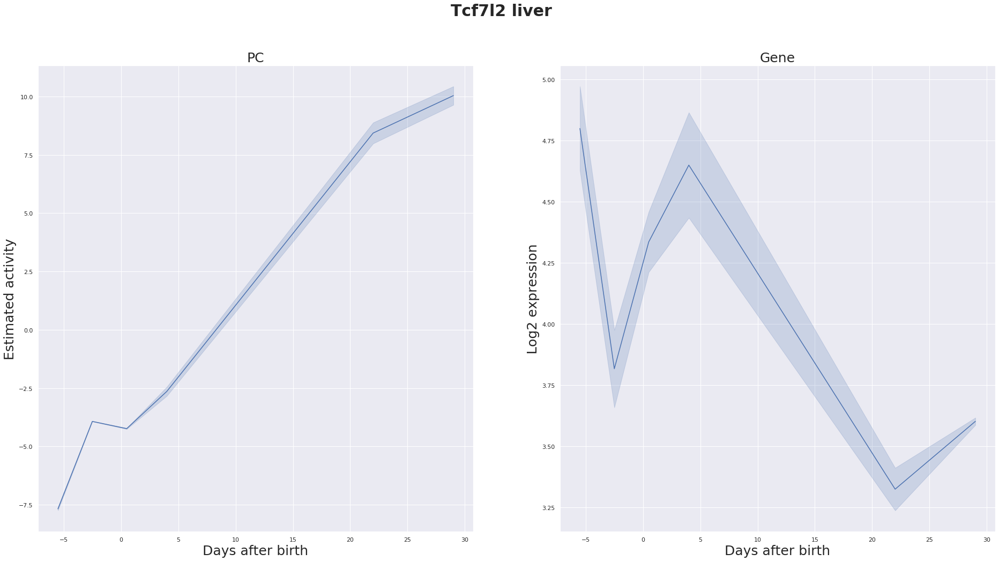

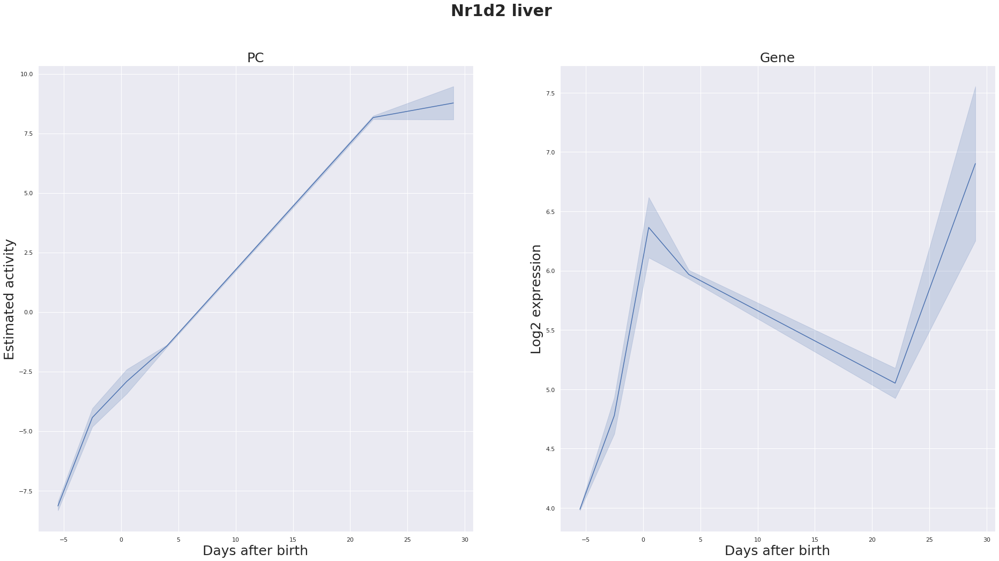

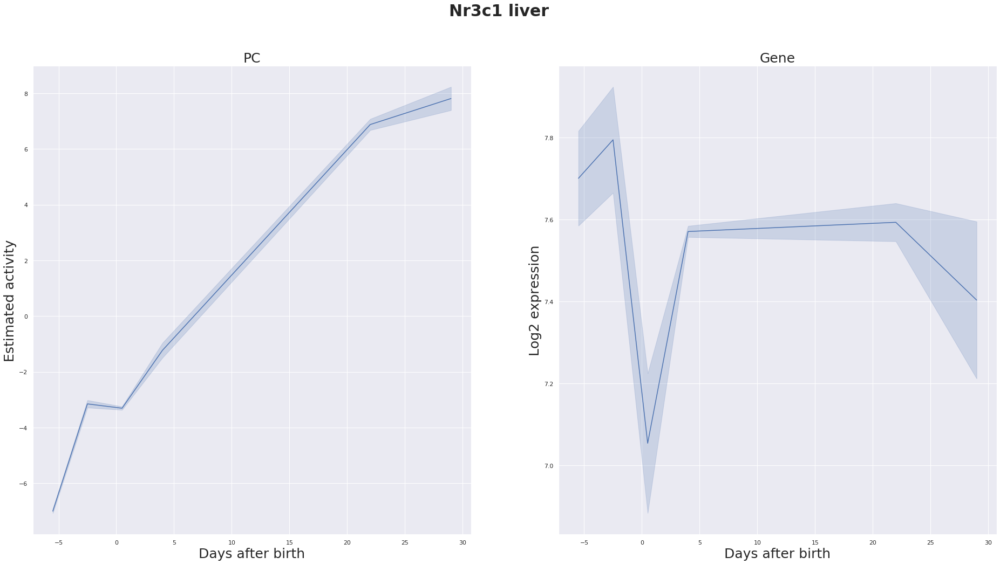

,Gene count,Variance explained PC1,MSE PC1
Tal1,82.0,60.994026,0.026937
Lmo2,80.0,56.508357,0.034205
Ncapg,14.0,59.797007,0.079700
Ikzf1,88.0,54.459688,0.041760
Top2a,5.0,72.182767,0.074134
Klf9,51.0,58.293236,0.284481
Brca1,16.0,62.786560,0.042558
Mllt3,9.0,66.684998,0.019501
Rb1,25.0,59.716052,0.052393
Sox11,93.0,58.551339,0.307997


In [5]:
organ ='liver'
organexpdata = expdata.loc[:,organ]

PC_values, additional_results, contributions, logdata = trong.main(TF_gene_sets,organexpdata,which=TFs)
trong.validation(PC_values, additional_results, logdata, organ, pc, remove, filtering)
additional_results

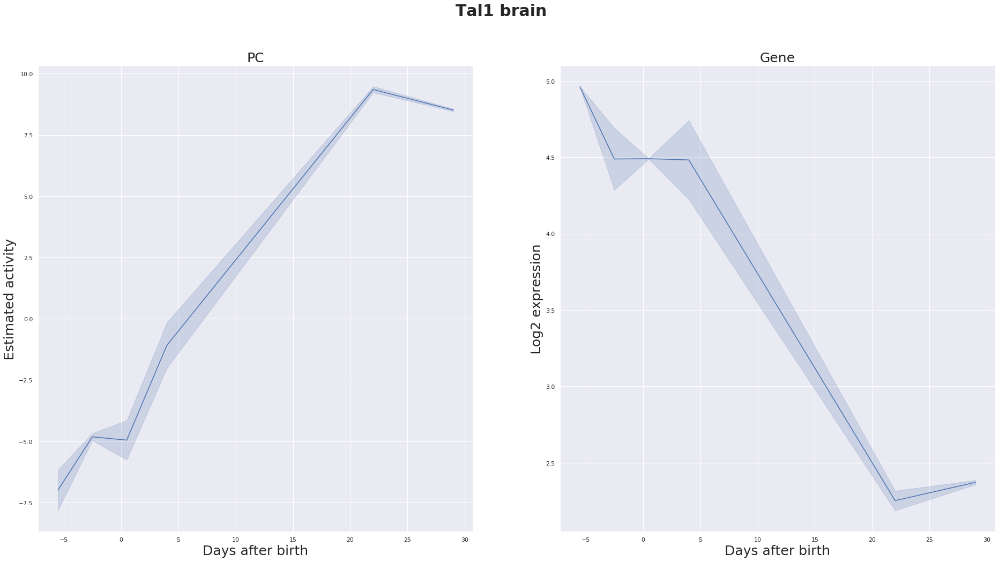

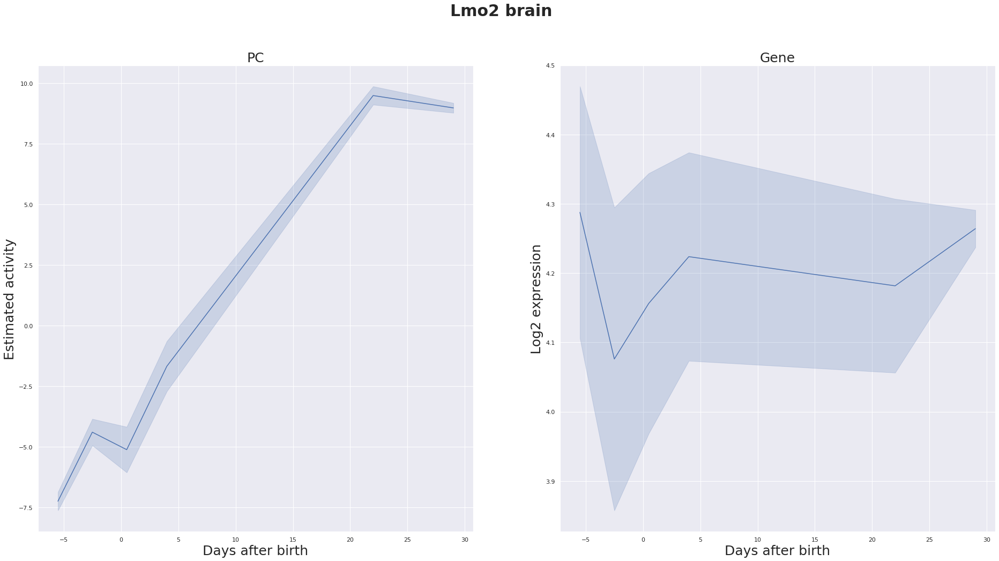

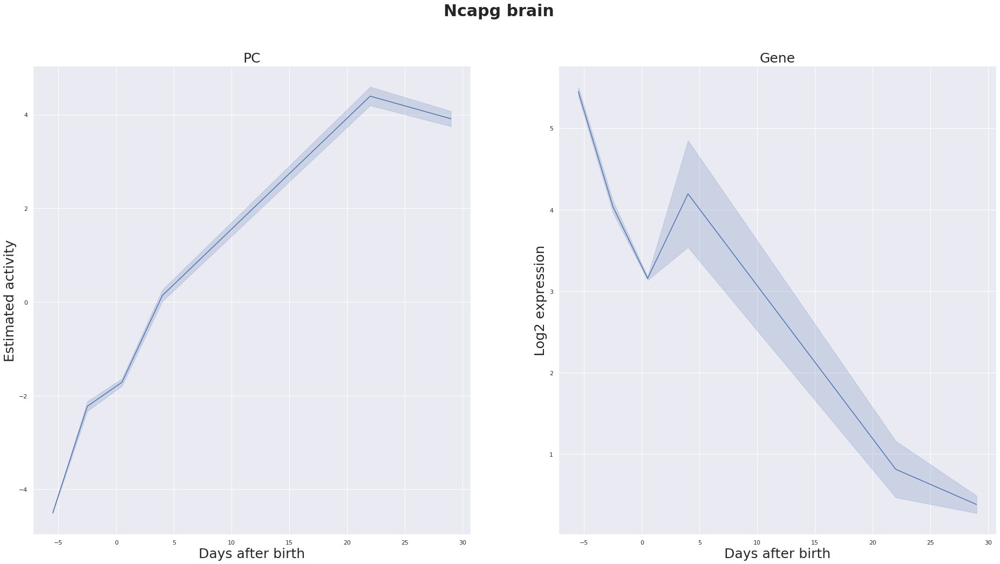

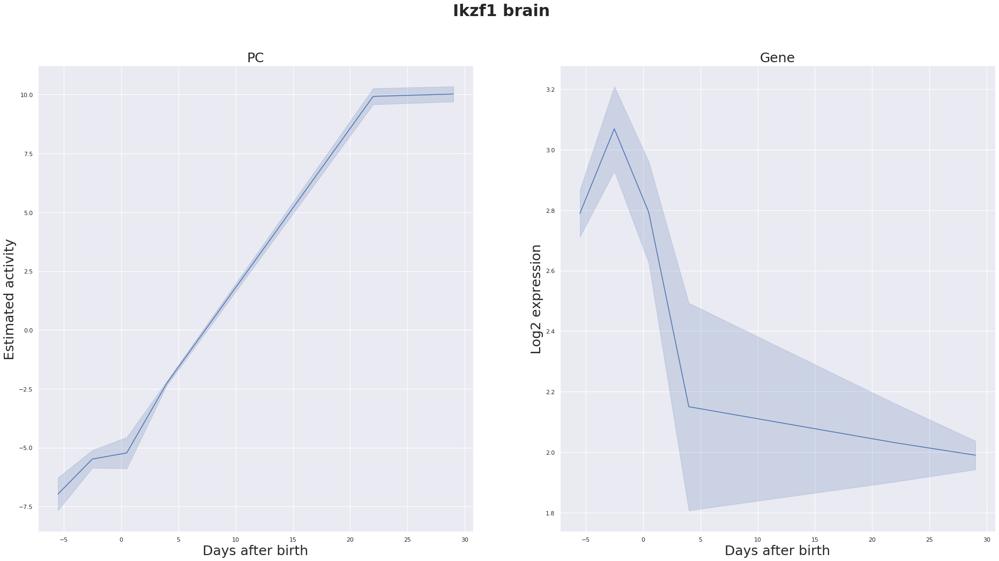

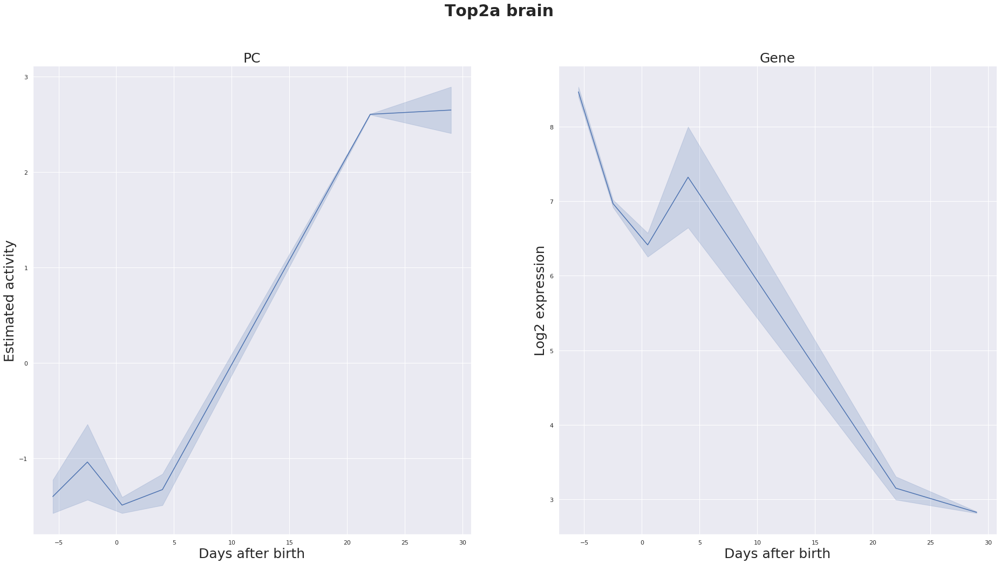

...

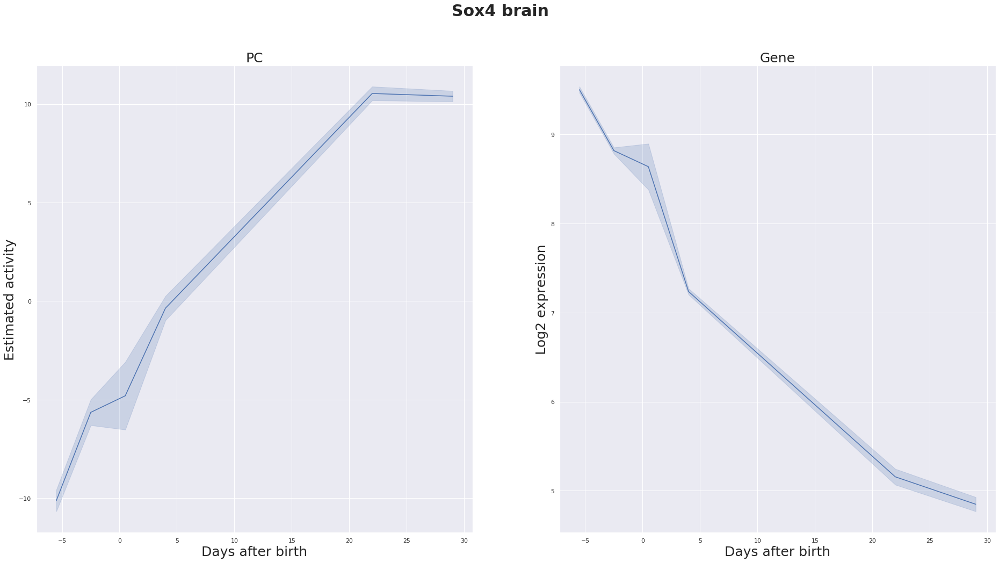

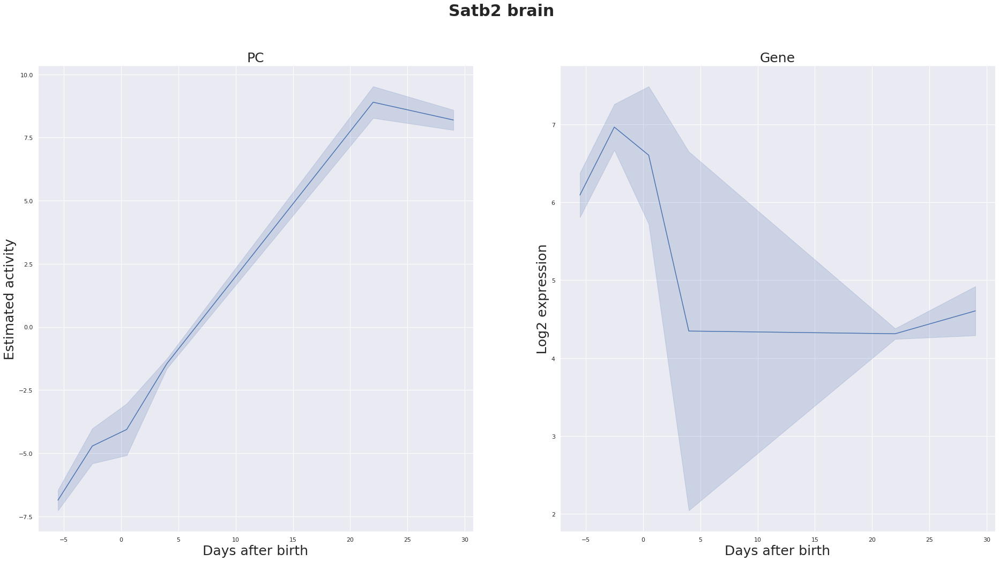

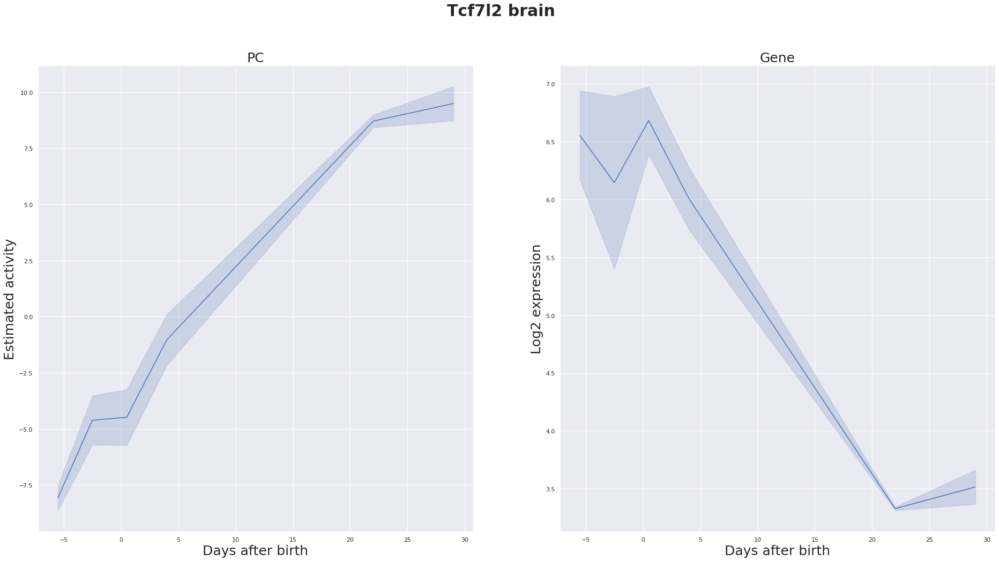

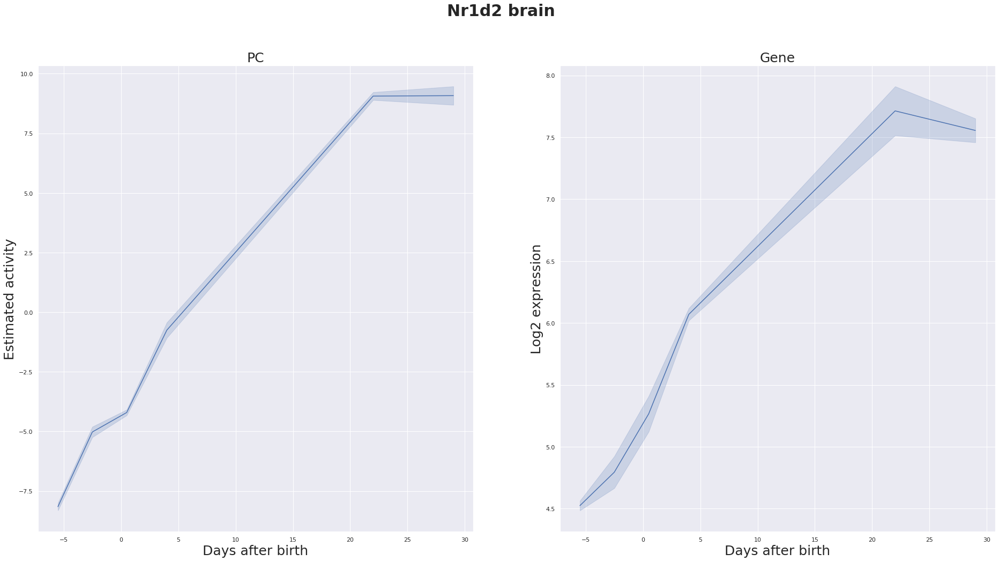

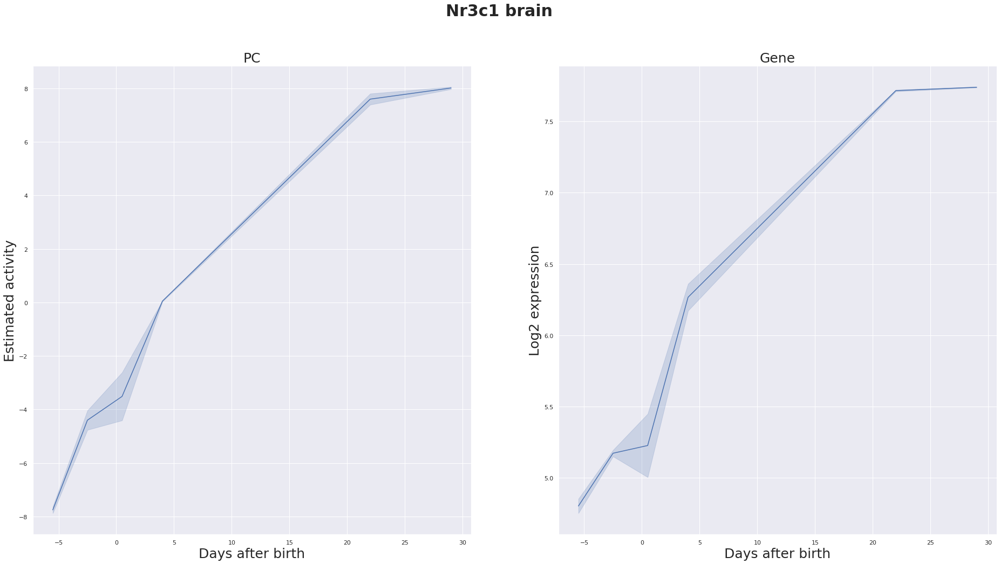

,Gene count,Variance explained PC1,MSE PC1
Tal1,83.0,52.243335,0.074481
Lmo2,80.0,57.144819,1.787066
Ncapg,15.0,69.923509,0.157098
Ikzf1,92.0,56.439168,0.435659
Top2a,5.0,70.302533,0.127047
Klf9,51.0,58.286148,0.064665
Brca1,17.0,46.561958,0.411990
Mllt3,12.0,56.160535,0.074073
Rb1,27.0,53.001632,0.194624
Sox11,96.0,63.170366,0.015383


In [5]:
organ ='brain'
organexpdata = expdata.loc[:,organ]

PC_values, additional_results, contributions, logdata = trong.main(TF_gene_sets,organexpdata,which=TFs)
trong.validation(PC_values, additional_results, logdata, organ, pc, remove, filtering)
additional_results

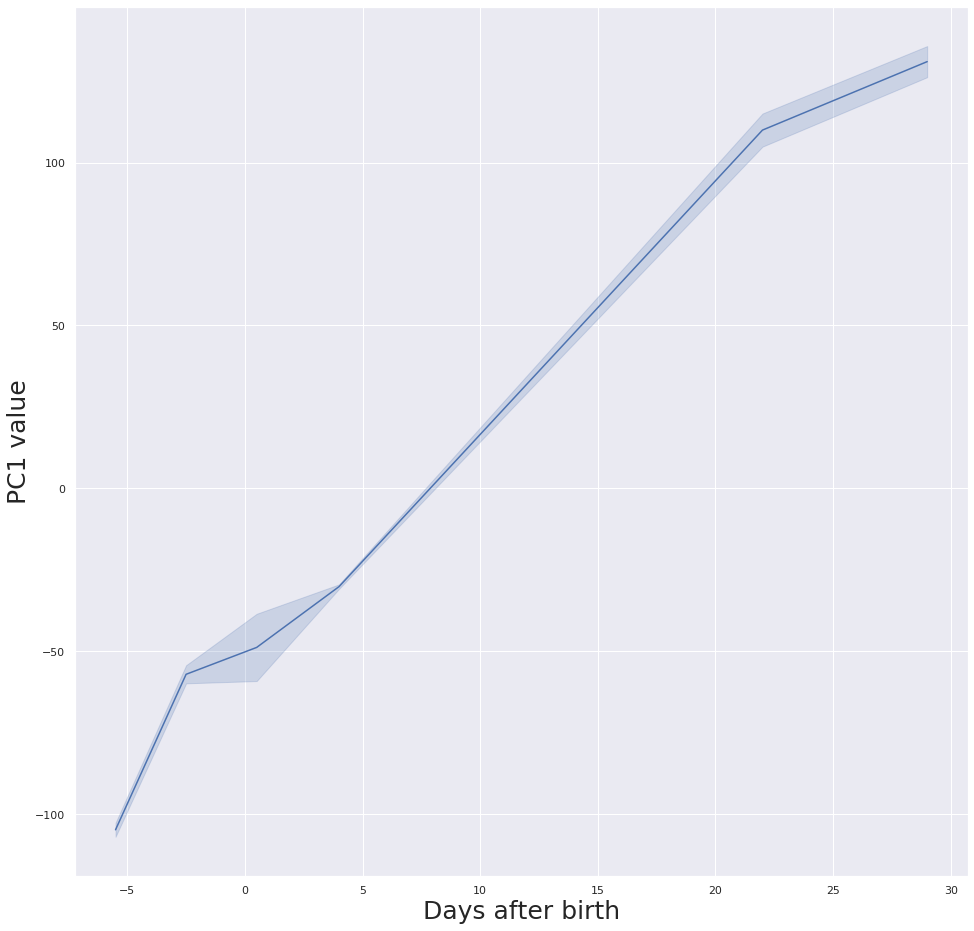

In [4]:
organ ='liver'
organexpdata = expdata.loc[:,organ]

PCA_results, explained_var, contributions = trong.testall(organexpdata,organ=organ,remove=remove)

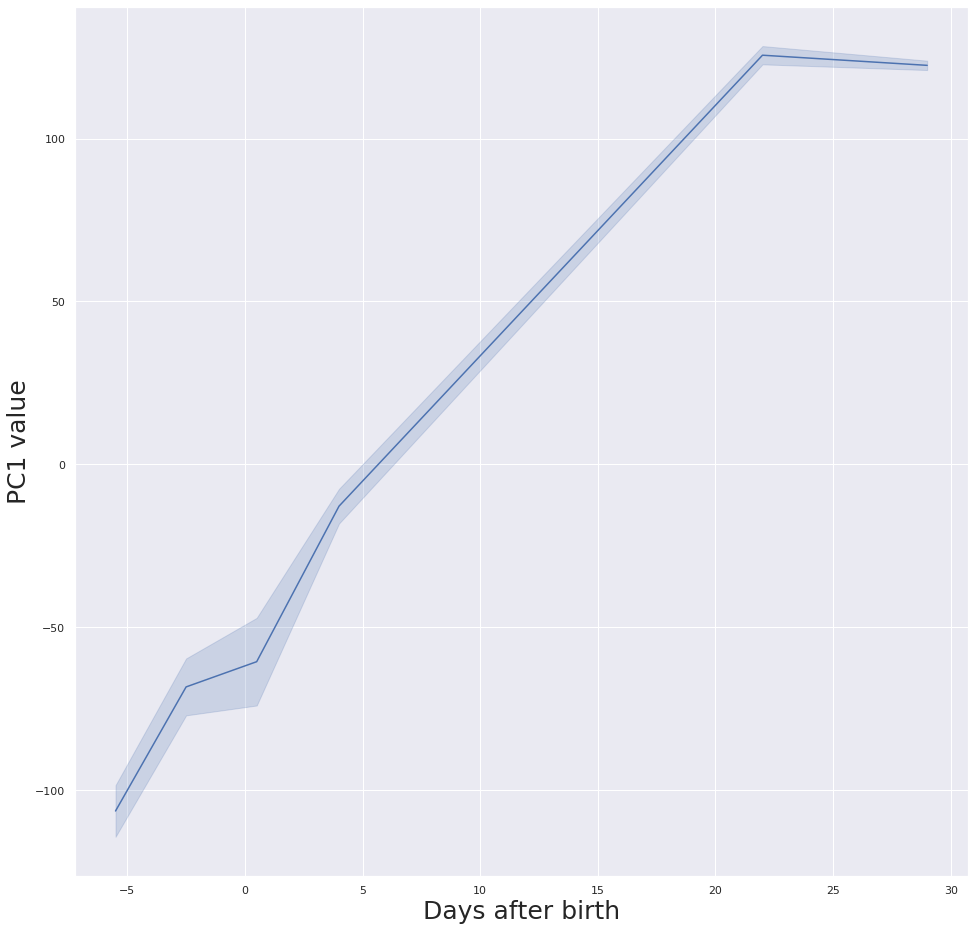

In [5]:
organ ='brain'
organexpdata = expdata.loc[:,organ]

PCA_results, explained_var, contributions = trong.testall(organexpdata,organ=organ,remove=remove)

Hsf2 has less than 3 genes associated with it and is therefore disregarded.
Nfic has less than 3 genes associated with it and is therefore disregarded.
Pcgf5 has less than 3 genes associated with it and is therefore disregarded.
Phf20 has less than 3 genes associated with it and is therefore disregarded.
Smad6 has less than 3 genes associated with it and is therefore disregarded.
Smc5 has less than 3 genes associated with it and is therefore disregarded.
Suv39h1 has less than 3 genes associated with it and is therefore disregarded.
Uhrf1 has less than 3 genes associated with it and is therefore disregarded.
Was has less than 3 genes associated with it and is therefore disregarded.


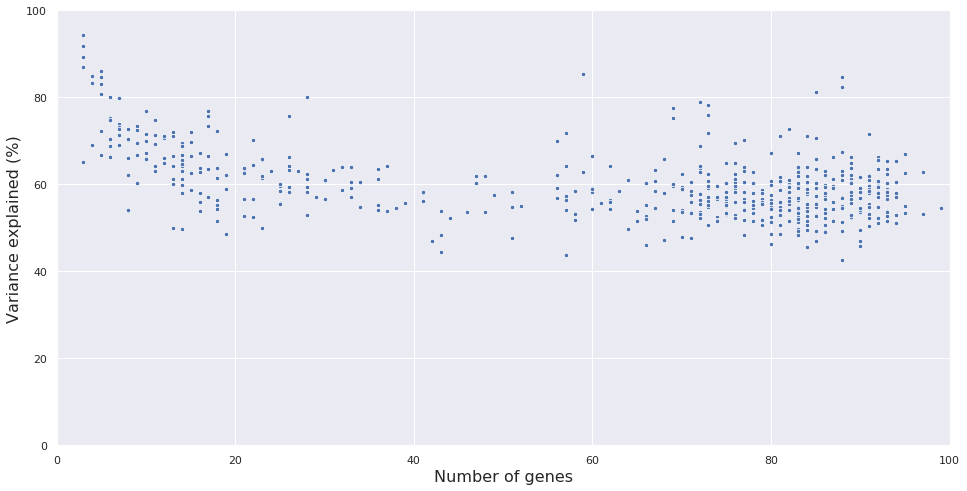

In [4]:
organ ='liver'
organexpdata = expdata.loc[:,organ]
PC_values, additional_results, contributions = trong.datacheck(TF_gene_sets, organexpdata, kbp,MACS2,MAX,n_pc=1,organ=organ,varexp=[1])

Hsf2 has less than 3 genes associated with it and is therefore disregarded.
Pcgf5 has less than 3 genes associated with it and is therefore disregarded.
Smad6 has less than 3 genes associated with it and is therefore disregarded.
Smc5 has less than 3 genes associated with it and is therefore disregarded.
Uhrf1 has less than 3 genes associated with it and is therefore disregarded.
Was has less than 3 genes associated with it and is therefore disregarded.


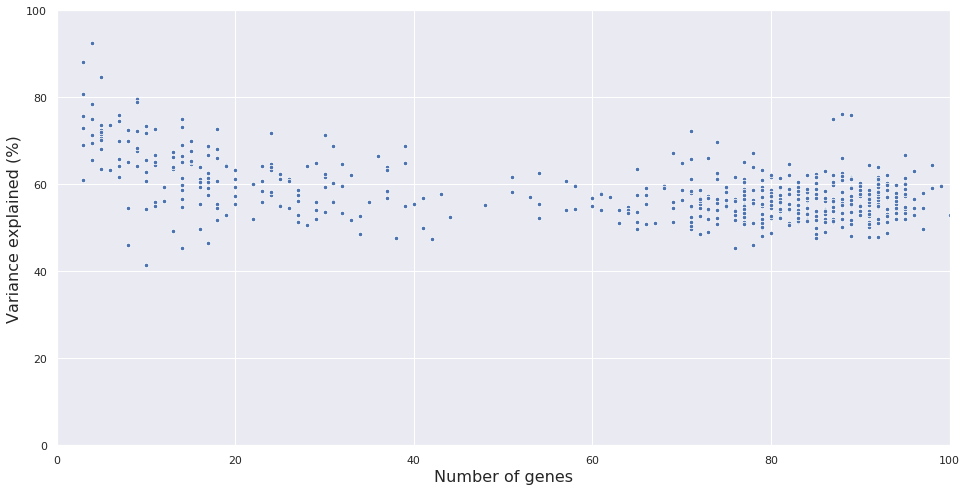

In [6]:
organ ='brain'
organexpdata = expdata.loc[:,organ]
PC_values, additional_results, contributions = trong.datacheck(TF_gene_sets, organexpdata, kbp,MACS2,MAX,n_pc=1,organ=organ,varexp=[1])

## Remove PC1

In [9]:
n_pc = 1
pc = 1
TFs = ['Tal1','Lmo2','Ncapg','Ikzf1','Top2a','Klf9','Brca1','Mllt3','Rb1','Sox11','Zfp57','Lmnb1','Sox4','Satb2','Tcf7l2','Nr1d2','Nr3c1']
remove = 1
filtering = False

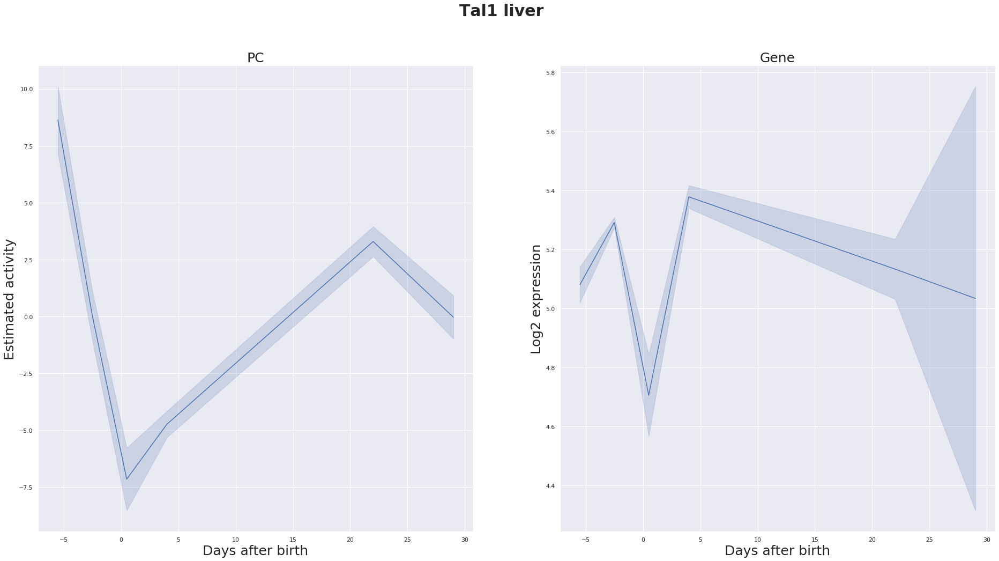

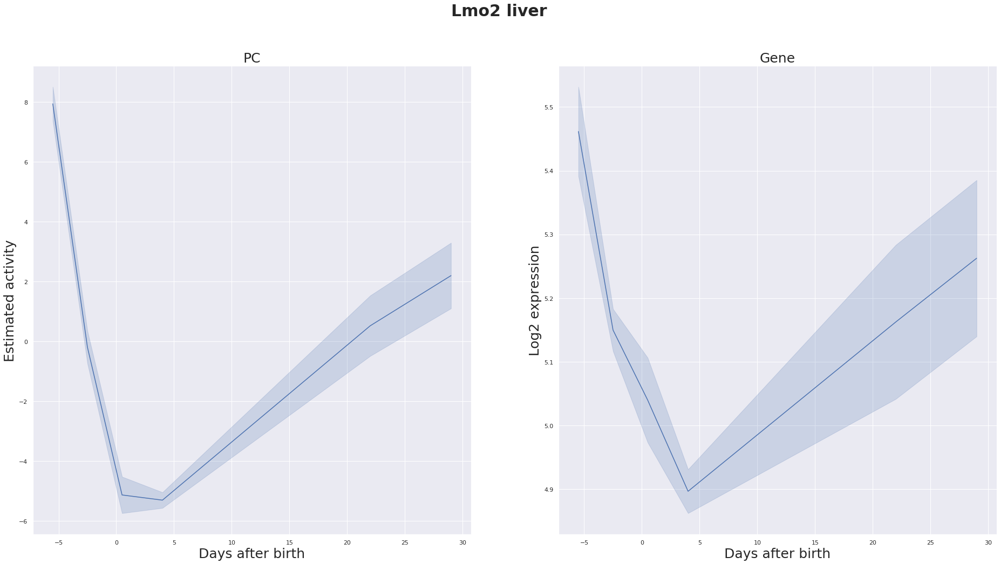

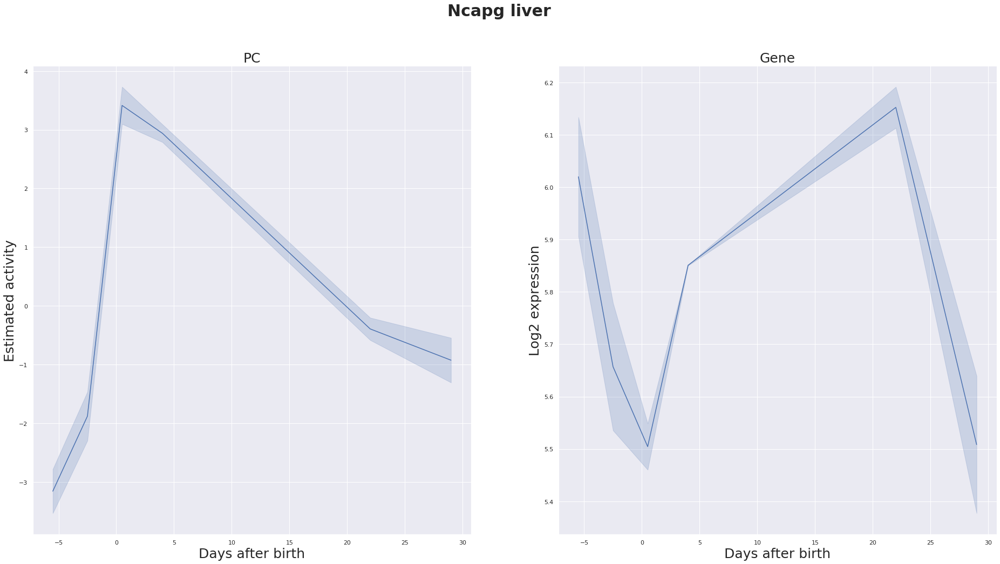

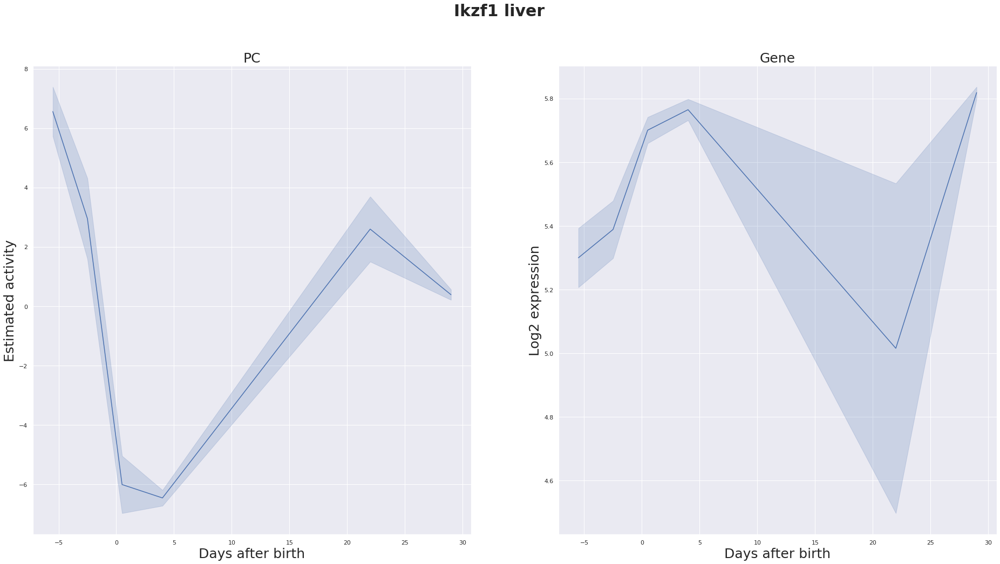

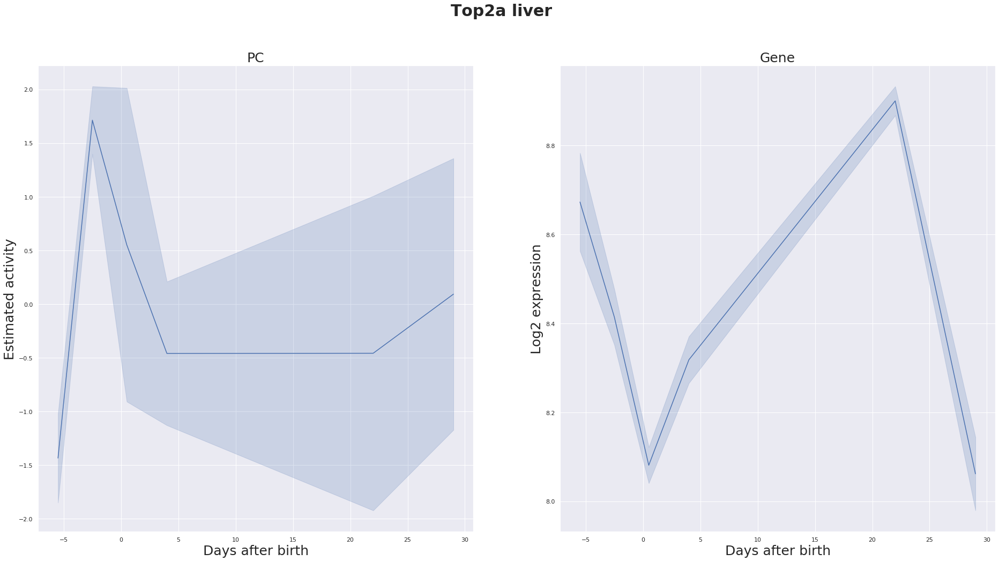

...

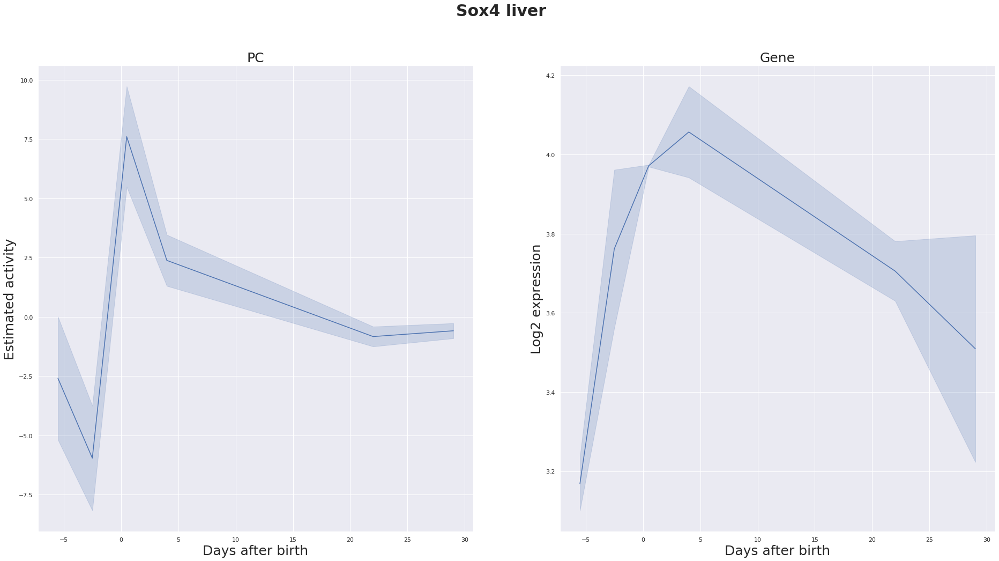

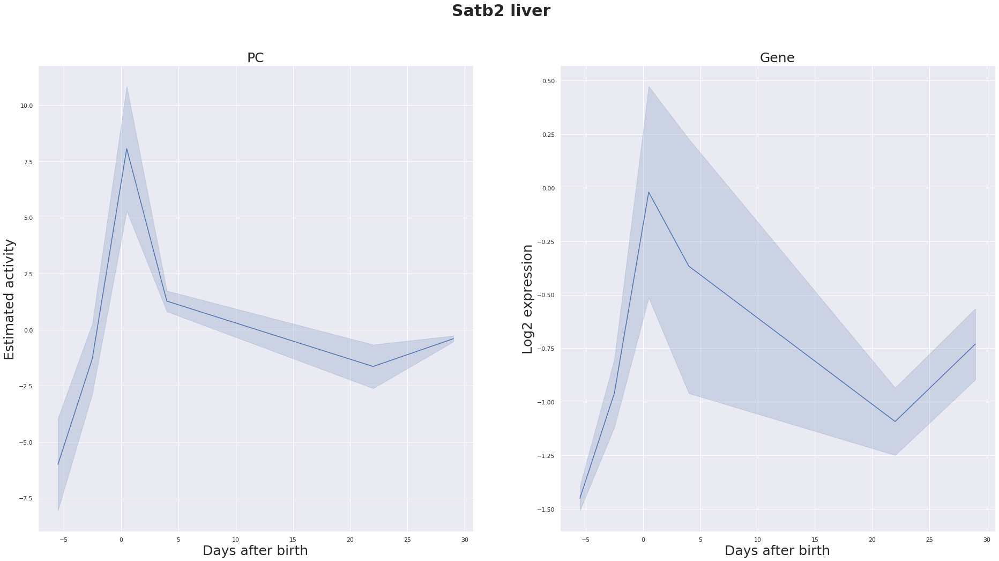

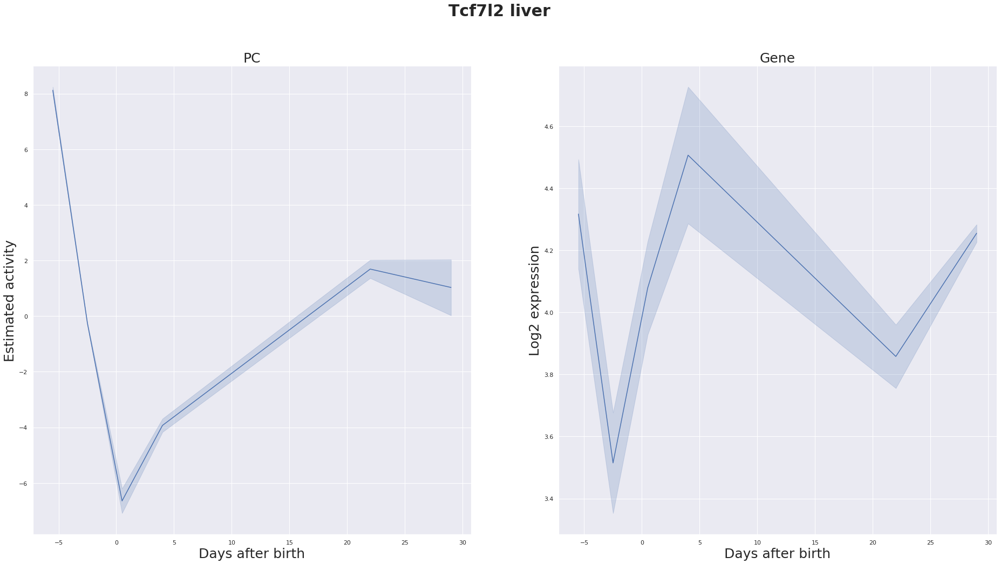

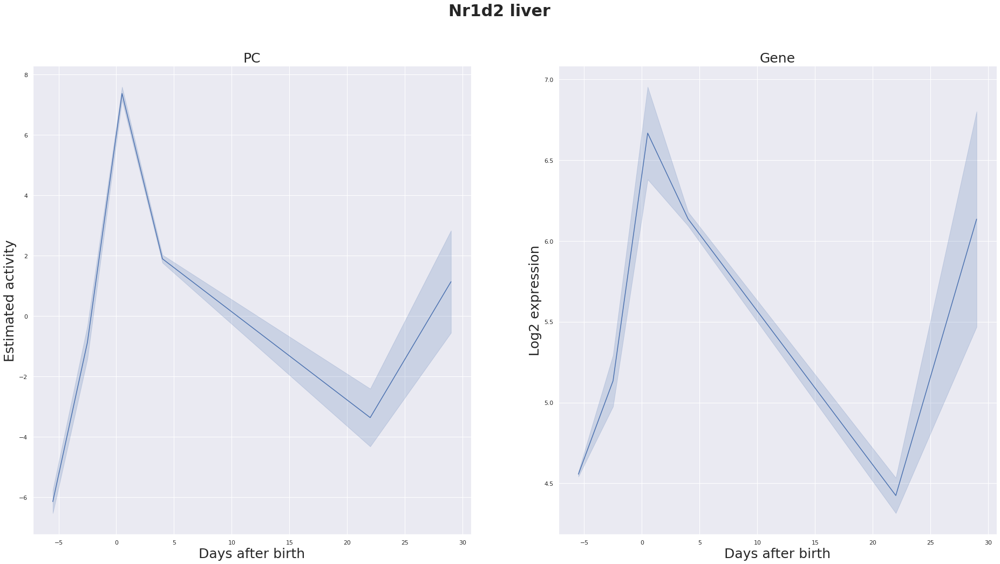

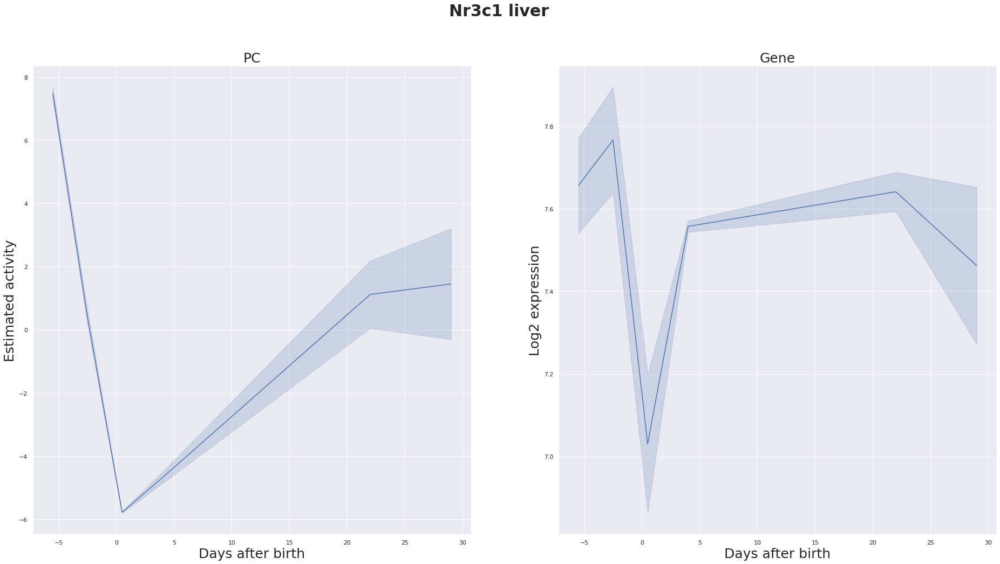

,Gene count,Variance explained PC1,MSE PC1
Tal1,82.0,33.738918,1.912631
Lmo2,80.0,26.263051,0.288834
Ncapg,14.0,42.159547,1.319602
Ikzf1,88.0,26.774449,0.764699
Top2a,5.0,41.105140,1.190465
Klf9,51.0,29.735278,1.243258
Brca1,16.0,30.743222,1.089512
Mllt3,9.0,39.046434,0.860245
Rb1,25.0,26.826871,1.797516
Sox11,93.0,27.182772,1.876415


In [8]:
organ ='liver'
organexpdata = expdata.loc[:,organ]

PC_values, additional_results, contributions, logdata = trong.main(TF_gene_sets,organexpdata,which=TFs,remove=remove)
trong.validation(PC_values, additional_results, logdata, organ, pc, remove, filtering)
additional_results

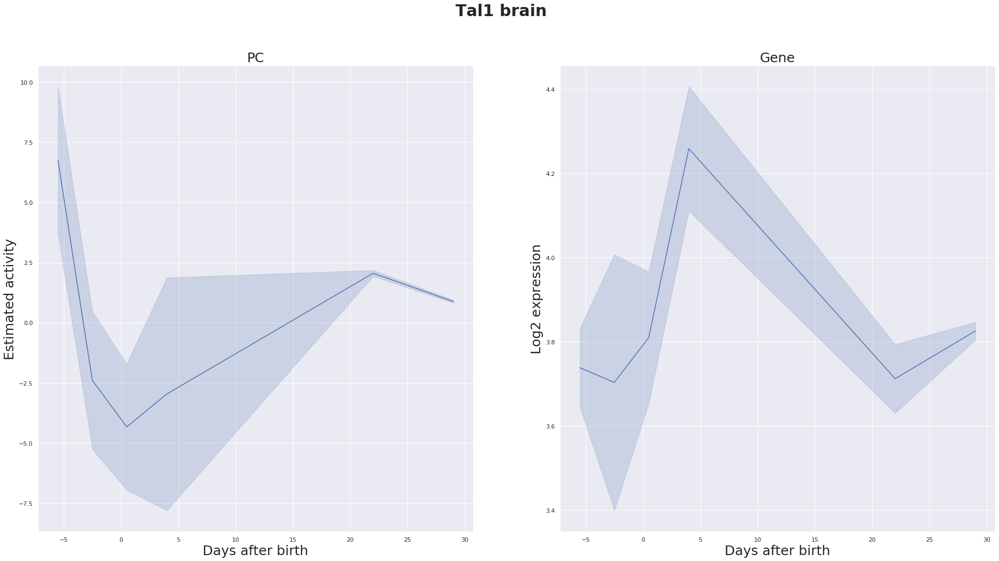

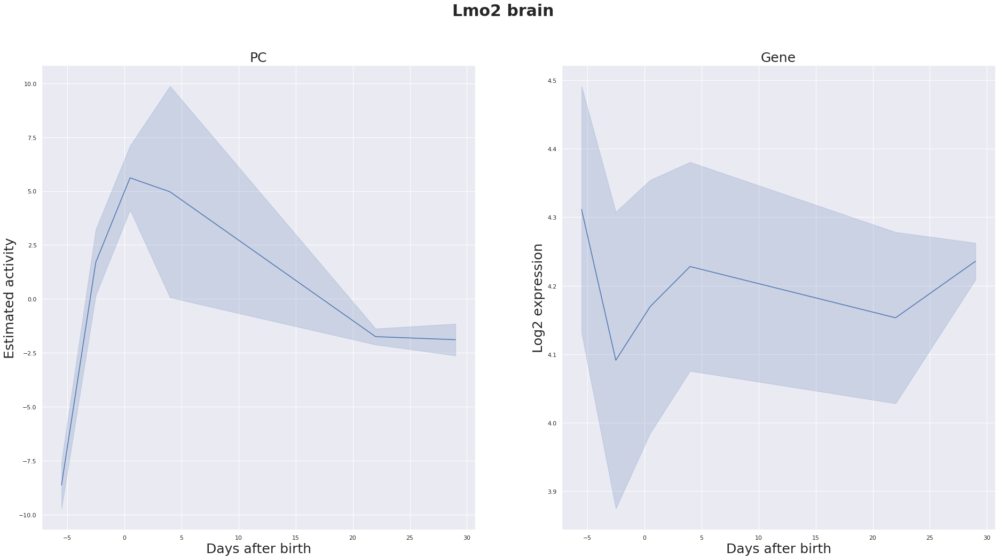

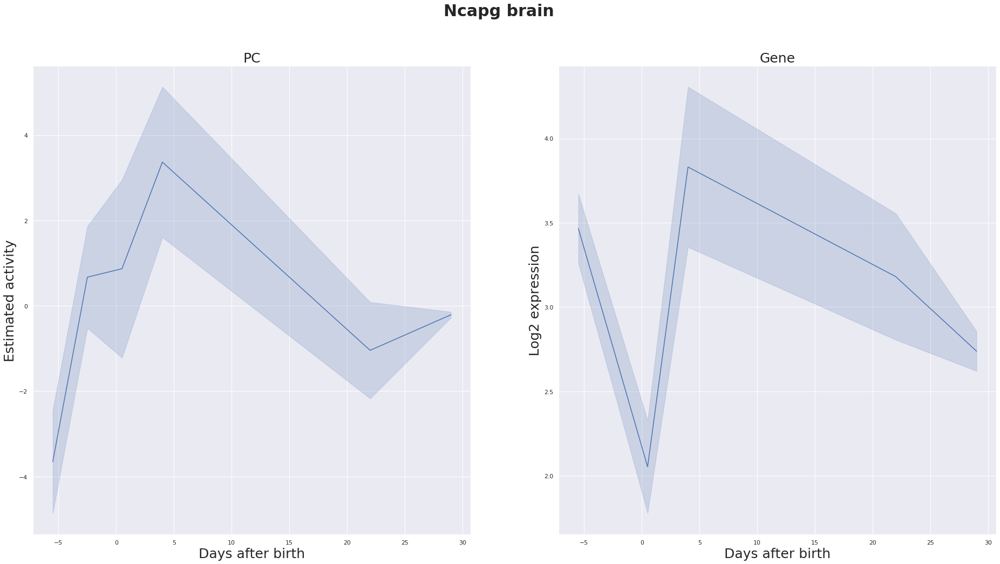

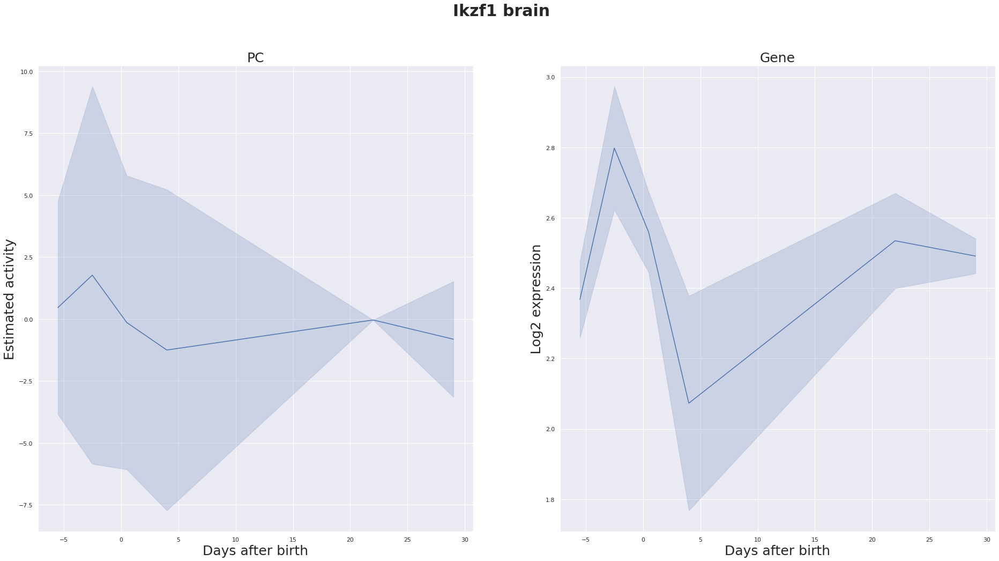

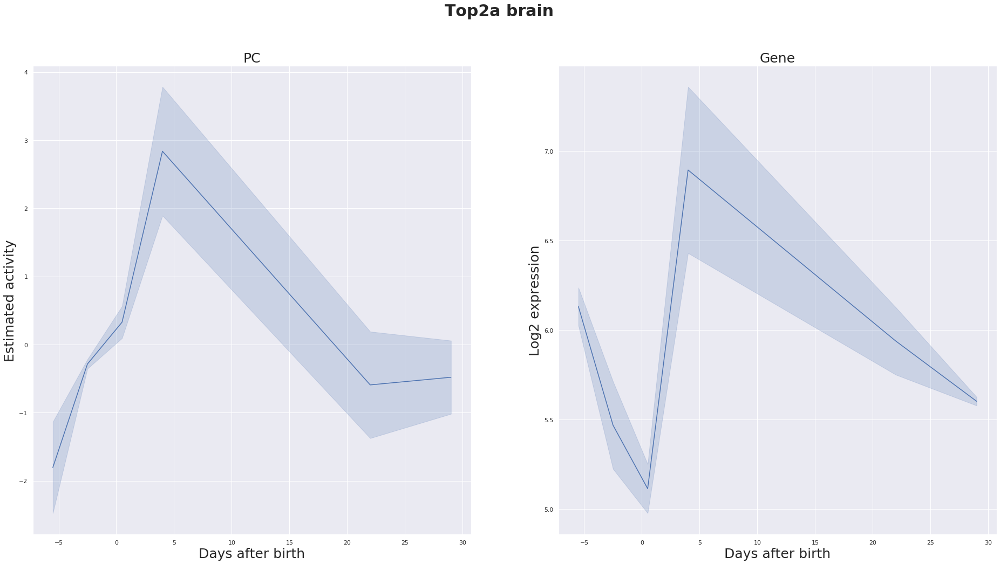

...

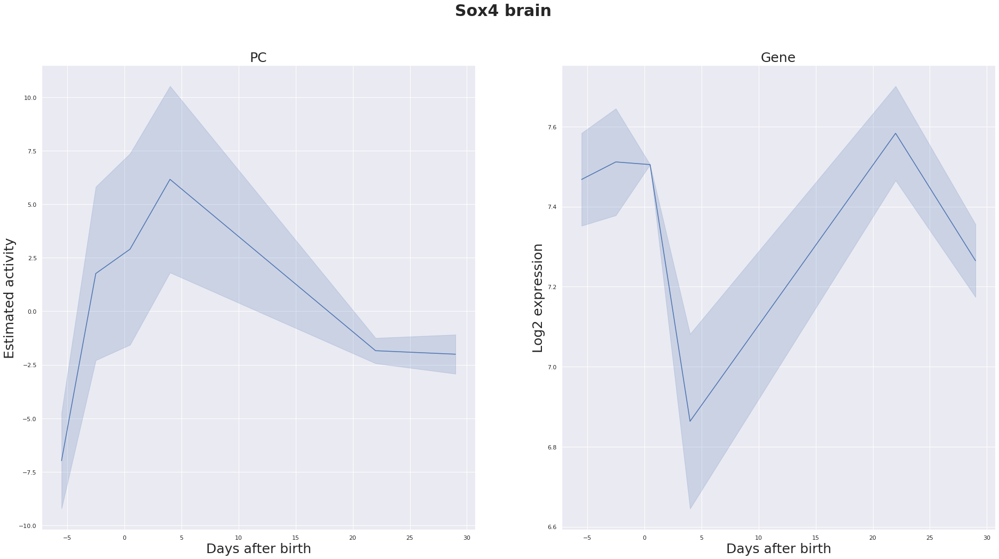

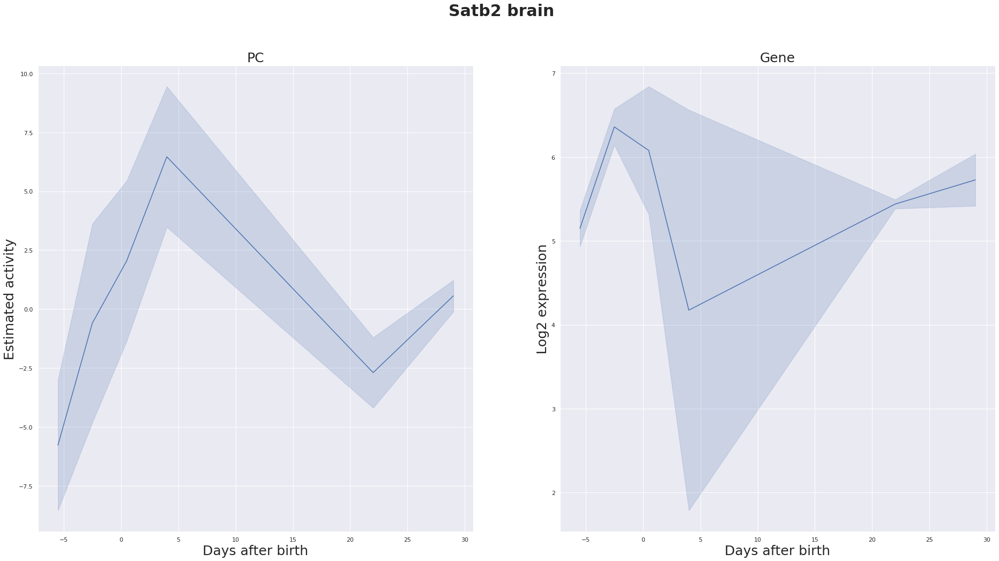

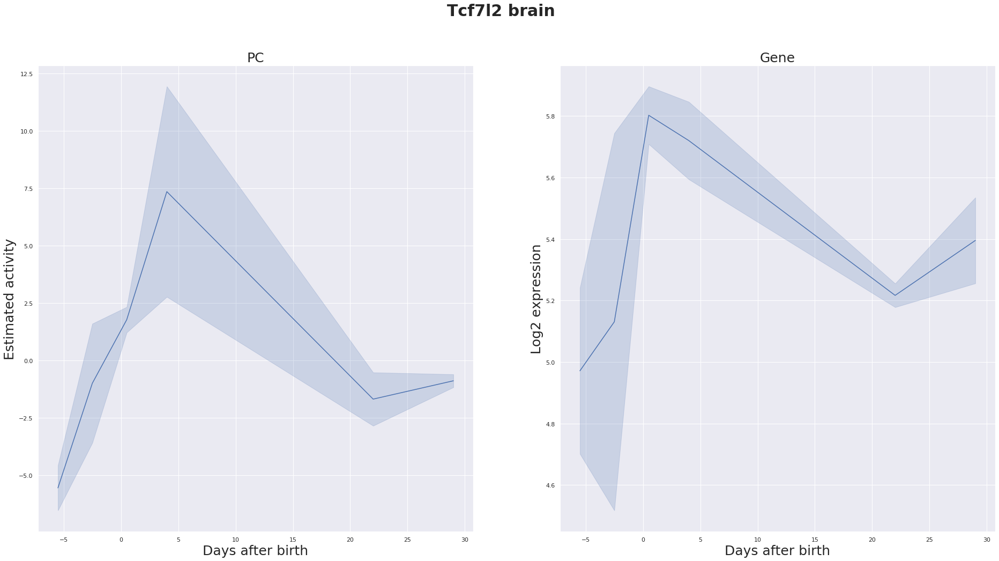

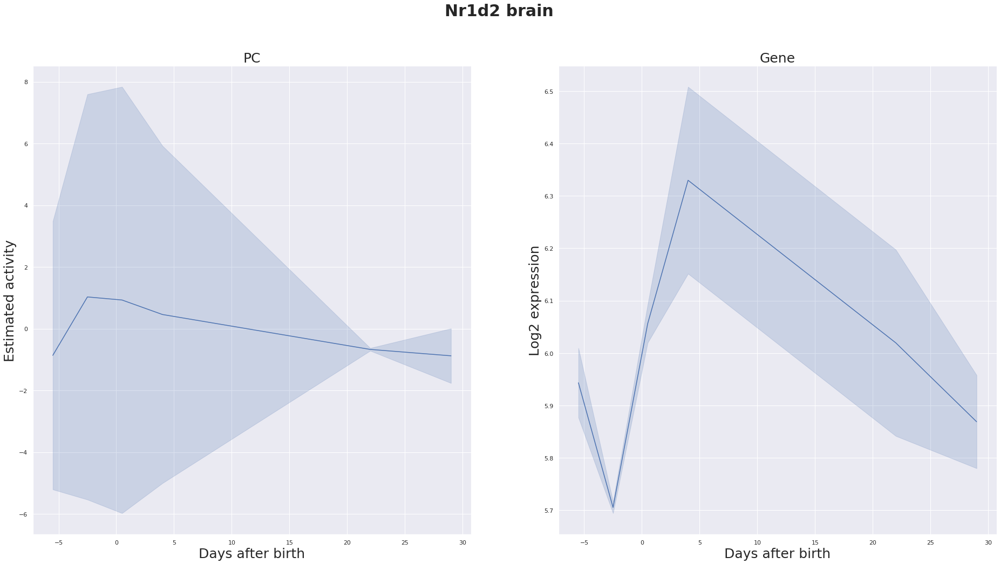

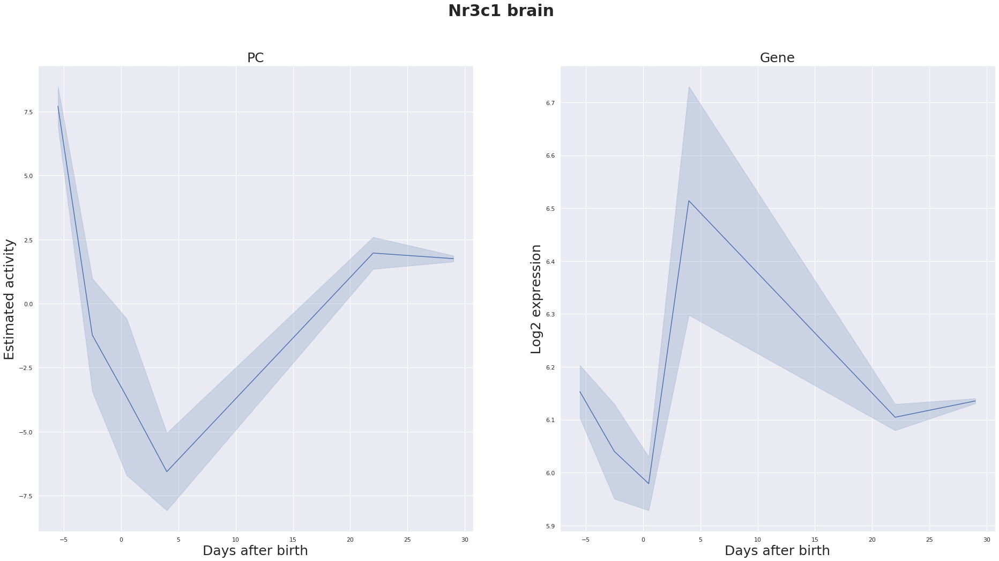

,Gene count,Variance explained PC1,MSE PC1
Tal1,83.0,26.502490,1.266284
Lmo2,80.0,35.567507,1.579121
Ncapg,15.0,42.938711,1.856944
Ikzf1,92.0,29.838578,1.937788
Top2a,5.0,47.952787,1.014319
Klf9,51.0,31.173844,0.303868
Brca1,17.0,33.815091,1.119780
Mllt3,12.0,48.216390,0.483901
Rb1,27.0,28.255022,0.548042
Sox11,96.0,28.799812,1.755641


In [9]:
organ ='brain'
organexpdata = expdata.loc[:,organ]

PC_values, additional_results, contributions, logdata = trong.main(TF_gene_sets,organexpdata,which=TFs,remove=remove)
trong.validation(PC_values, additional_results, logdata, organ, pc, remove, filtering)
additional_results

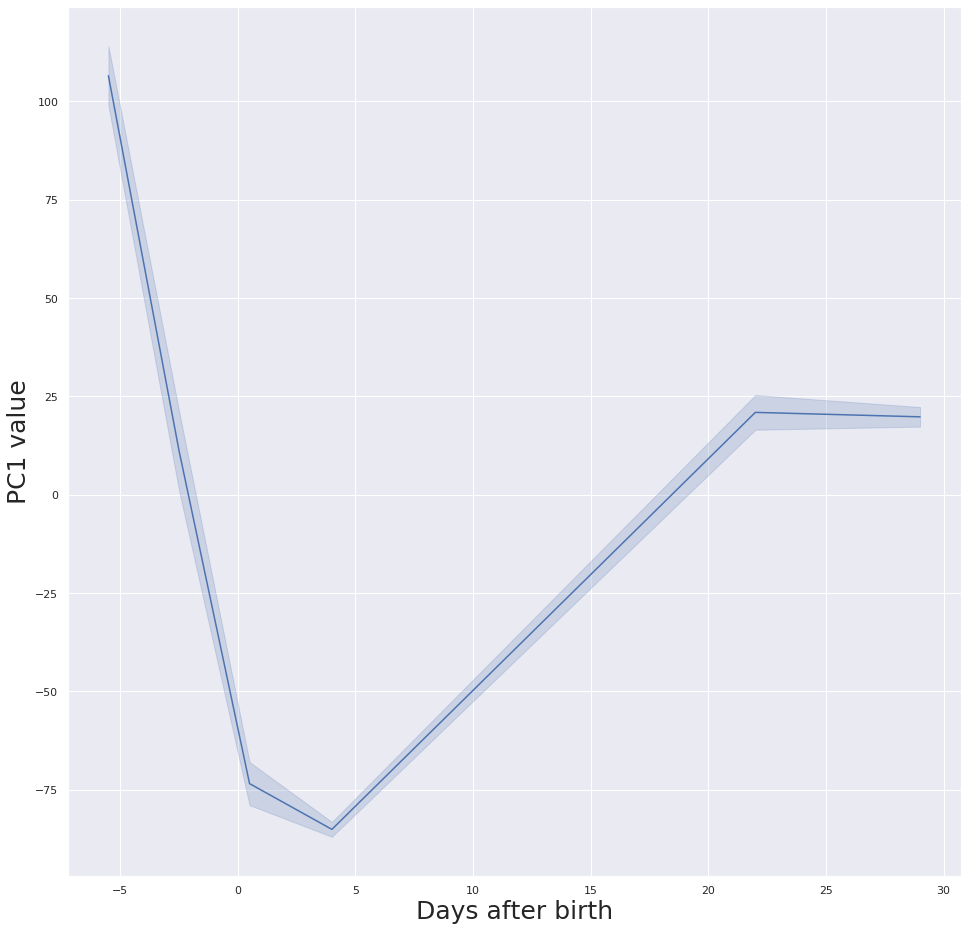

In [7]:
organ ='liver'
organexpdata = expdata.loc[:,organ]

PCA_results, explained_var, contributions = trong.testall(organexpdata,organ=organ,remove=remove)

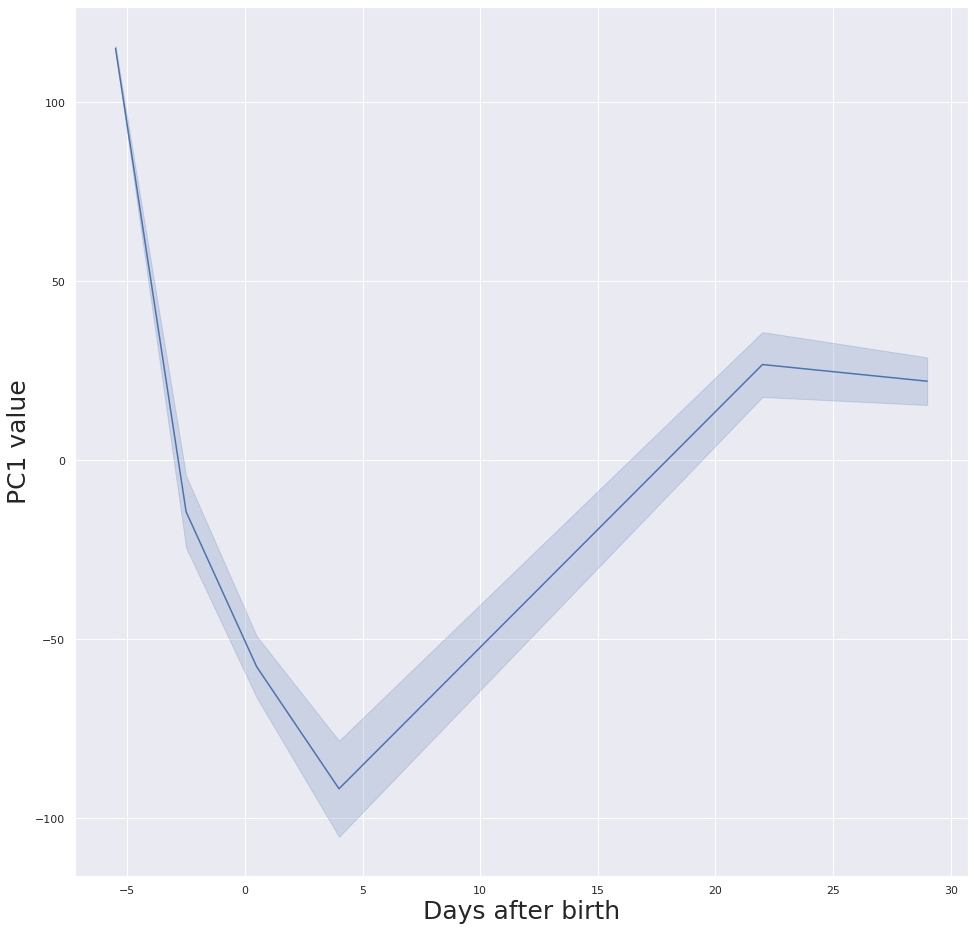

In [8]:
organ ='brain'
organexpdata = expdata.loc[:,organ]

PCA_results, explained_var, contributions = trong.testall(organexpdata,organ=organ,remove=1)

Hsf2 has less than 3 genes associated with it and is therefore disregarded.
Nfic has less than 3 genes associated with it and is therefore disregarded.
Pcgf5 has less than 3 genes associated with it and is therefore disregarded.
Phf20 has less than 3 genes associated with it and is therefore disregarded.
Smad6 has less than 3 genes associated with it and is therefore disregarded.
Smc5 has less than 3 genes associated with it and is therefore disregarded.
Suv39h1 has less than 3 genes associated with it and is therefore disregarded.
Uhrf1 has less than 3 genes associated with it and is therefore disregarded.
Was has less than 3 genes associated with it and is therefore disregarded.


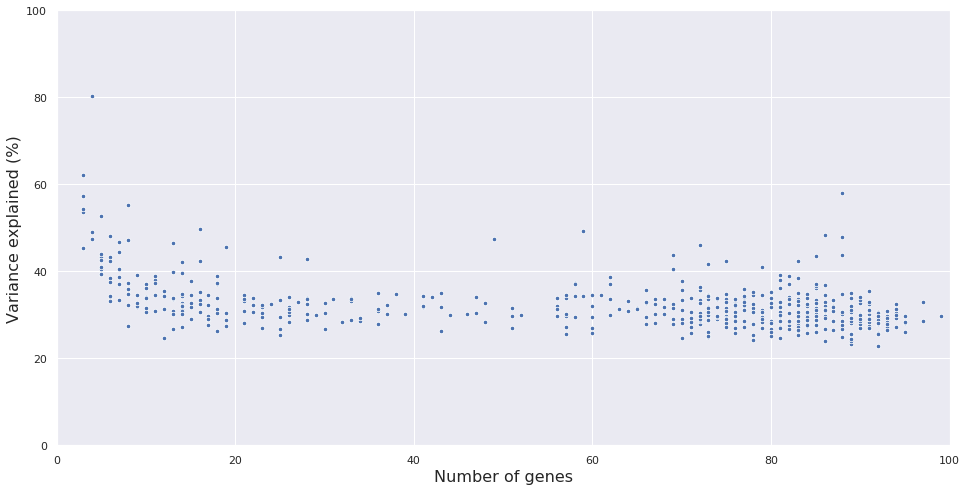

In [10]:
organ ='liver'
organexpdata = expdata.loc[:,organ]
PC_values, additional_results, contributions = trong.datacheck(TF_gene_sets, organexpdata, kbp,MACS2,MAX,n_pc=1,organ=organ,varexp=[1], remove=remove)

Hsf2 has less than 3 genes associated with it and is therefore disregarded.
Pcgf5 has less than 3 genes associated with it and is therefore disregarded.
Smad6 has less than 3 genes associated with it and is therefore disregarded.
Smc5 has less than 3 genes associated with it and is therefore disregarded.
Uhrf1 has less than 3 genes associated with it and is therefore disregarded.
Was has less than 3 genes associated with it and is therefore disregarded.


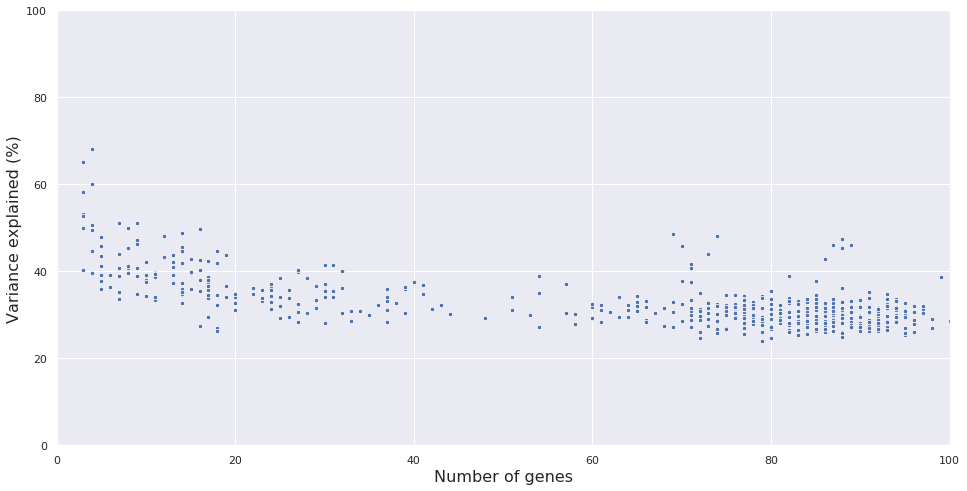

In [11]:
organ ='brain'
organexpdata = expdata.loc[:,organ]
PC_values, additional_results, contributions = trong.datacheck(TF_gene_sets, organexpdata, kbp,MACS2,MAX,n_pc=1,organ=organ,varexp=[1], remove=remove)

# Remove genes with 6+ 0-values
## All PCs

In [ ]:
n_pc = 1
pc = 1
TFs = ['Tal1','Lmo2','Ncapg','Ikzf1','Top2a','Klf9','Brca1','Mllt3','Rb1','Sox11','Zfp57','Lmnb1','Sox4','Satb2','Tcf7l2','Nr1d2','Nr3c1']
remove = None
filtering = True

In [ ]:
organ ='liver'
organexpdata = expdata.loc[:,organ]

PC_values, additional_results, contributions, logdata = trong.main(TF_gene_sets,organexpdata,which=TFs)
trong.validation(PC_values, additional_results, logdata, organ, pc, remove, filtering)
additional_results

In [ ]:
organ ='brain'
organexpdata = expdata.loc[:,organ]

PC_values, additional_results, contributions, logdata = trong.main(TF_gene_sets,organexpdata,which=TFs)
trong.validation(PC_values, additional_results, logdata, organ, pc, remove, filtering)
additional_results

In [ ]:
organ ='liver'
organexpdata = expdata.loc[:,organ]
PC_values, additional_results, contributions = trong.datacheck(TF_gene_sets, organexpdata, kbp,MACS2,MAX,n_pc=1,organ=organ,filtering=filtering,varexp=[1])

In [ ]:
organ ='brain'
organexpdata = expdata.loc[:,organ]
PC_values, additional_results, contributions = trong.datacheck(TF_gene_sets, organexpdata, kbp,MACS2,MAX,n_pc=1,organ=organ,filtering=filtering,varexp=[1])

## Remove PC1

In [ ]:
n_pc = 1
pc = 1
TFs = ['Tal1','Lmo2','Ncapg','Ikzf1','Top2a','Klf9','Brca1','Mllt3','Rb1','Sox11','Zfp57','Lmnb1','Sox4','Satb2','Tcf7l2','Nr1d2','Nr3c1']
remove = 1
filtering = True

In [ ]:
organ ='liver'
organexpdata = expdata.loc[:,organ]

PC_values, additional_results, contributions, logdata = trong.main(TF_gene_sets,organexpdata,which=TFs,remove=remove)
trong.validation(PC_values, additional_results, logdata, organ, pc, remove, filtering)
additional_results

In [ ]:
organ ='brain'
organexpdata = expdata.loc[:,organ]

PC_values, additional_results, contributions, logdata = trong.main(TF_gene_sets,organexpdata,which=TFs,remove=remove)
trong.validation(PC_values, additional_results, logdata, organ, pc, remove, filtering)
additional_results

In [ ]:
organ ='liver'
organexpdata = expdata.loc[:,organ]
PC_values, additional_results, contributions = trong.datacheck(TF_gene_sets, organexpdata, kbp,MACS2,MAX,n_pc=1,organ=organ,varexp=[1],filtering=filtering,remove=remove)

In [ ]:
organ ='brain'
organexpdata = expdata.loc[:,organ]
PC_values, additional_results, contributions = trong.datacheck(TF_gene_sets, organexpdata, kbp,MACS2,MAX,n_pc=1,organ=organ,varexp=[1],filtering=filtering,remove=remove)